In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns 
import scipy.stats as stats
from sklearn.model_selection import train_test_split

In [2]:
df=pd.read_csv("fetal_health.csv")

In [3]:
df.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [4]:
df.columns

Index(['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability', 'histogram_width',
       'histogram_min', 'histogram_max', 'histogram_number_of_peaks',
       'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance', 'histogram_tendency',
       'fetal_health'],
      dtype='object')

In [5]:
df.shape

(2126, 22)

In [6]:
df.dtypes

baseline value                                            float64
accelerations                                             float64
fetal_movement                                            float64
uterine_contractions                                      float64
light_decelerations                                       float64
severe_decelerations                                      float64
prolongued_decelerations                                  float64
abnormal_short_term_variability                           float64
mean_value_of_short_term_variability                      float64
percentage_of_time_with_abnormal_long_term_variability    float64
mean_value_of_long_term_variability                       float64
histogram_width                                           float64
histogram_min                                             float64
histogram_max                                             float64
histogram_number_of_peaks                                 float64
histogram_

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

In [8]:
df.describe()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.00000,...,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,133.303857,0.003178,0.009481,0.004366,0.001889,0.000003,0.000159,46.990122,1.332785,9.84666,...,93.579492,164.025400,4.068203,0.323612,137.452023,134.610536,138.090310,18.808090,0.320320,1.304327
std,9.840844,0.003866,0.046666,0.002946,0.002960,0.000057,0.000590,17.192814,0.883241,18.39688,...,29.560212,17.944183,2.949386,0.706059,16.381289,15.593596,14.466589,28.977636,0.610829,0.614377
min,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.200000,0.00000,...,50.000000,122.000000,0.000000,0.000000,60.000000,73.000000,77.000000,0.000000,-1.000000,1.000000
25%,126.000000,0.000000,0.000000,0.002000,0.000000,0.000000,0.000000,32.000000,0.700000,0.00000,...,67.000000,152.000000,2.000000,0.000000,129.000000,125.000000,129.000000,2.000000,0.000000,1.000000
50%,133.000000,0.002000,0.000000,0.004000,0.000000,0.000000,0.000000,49.000000,1.200000,0.00000,...,93.000000,162.000000,3.000000,0.000000,139.000000,136.000000,139.000000,7.000000,0.000000,1.000000
75%,140.000000,0.006000,0.003000,0.007000,0.003000,0.000000,0.000000,61.000000,1.700000,11.00000,...,120.000000,174.000000,6.000000,0.000000,148.000000,145.000000,148.000000,24.000000,1.000000,1.000000
max,160.000000,0.019000,0.481000,0.015000,0.015000,0.001000,0.005000,87.000000,7.000000,91.00000,...,159.000000,238.000000,18.000000,10.000000,187.000000,182.000000,186.000000,269.000000,1.000000,3.000000


In [9]:
df.isnull().sum()

baseline value                                            0
accelerations                                             0
fetal_movement                                            0
uterine_contractions                                      0
light_decelerations                                       0
severe_decelerations                                      0
prolongued_decelerations                                  0
abnormal_short_term_variability                           0
mean_value_of_short_term_variability                      0
percentage_of_time_with_abnormal_long_term_variability    0
mean_value_of_long_term_variability                       0
histogram_width                                           0
histogram_min                                             0
histogram_max                                             0
histogram_number_of_peaks                                 0
histogram_number_of_zeroes                                0
histogram_mode                          

In [10]:
df1=df.copy()

In [11]:
df1.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [12]:
df1.shape

(2126, 22)

In [13]:
df1.dtypes

baseline value                                            float64
accelerations                                             float64
fetal_movement                                            float64
uterine_contractions                                      float64
light_decelerations                                       float64
severe_decelerations                                      float64
prolongued_decelerations                                  float64
abnormal_short_term_variability                           float64
mean_value_of_short_term_variability                      float64
percentage_of_time_with_abnormal_long_term_variability    float64
mean_value_of_long_term_variability                       float64
histogram_width                                           float64
histogram_min                                             float64
histogram_max                                             float64
histogram_number_of_peaks                                 float64
histogram_

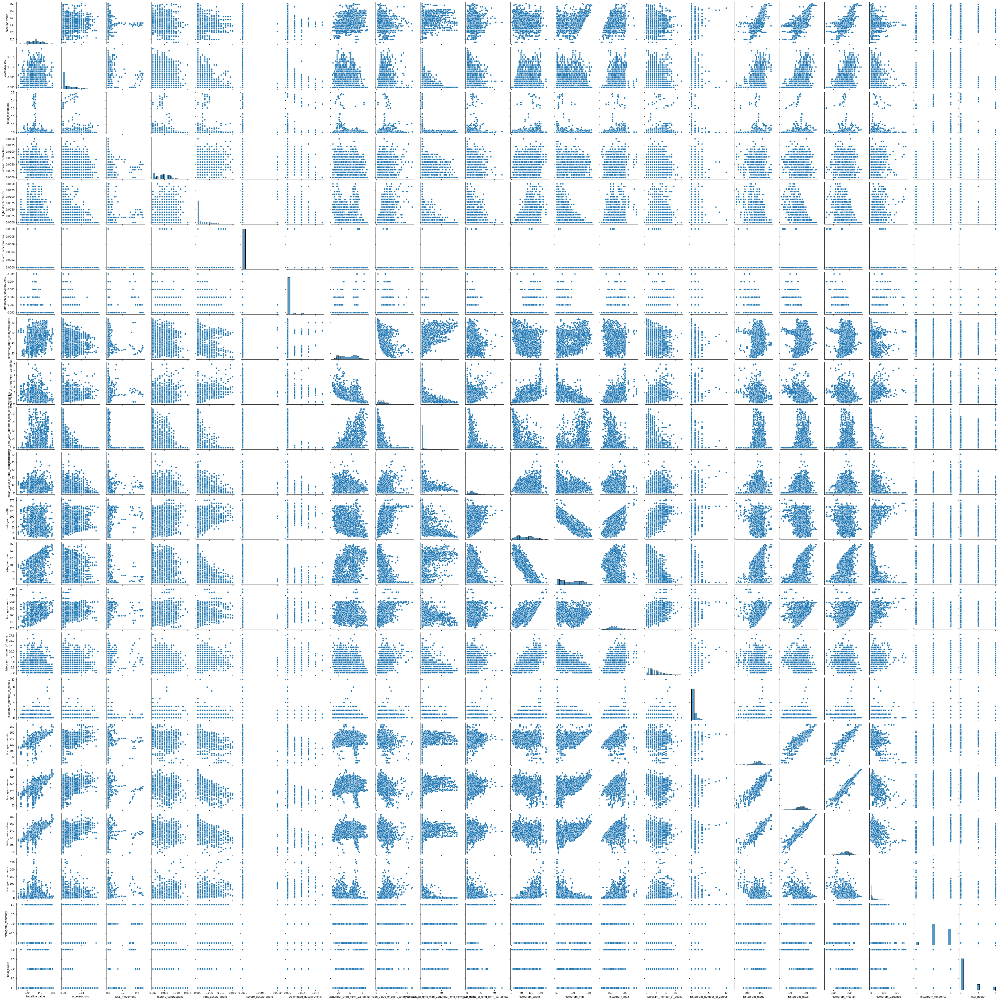

In [14]:
sns.pairplot(data=df1)

C:\Users\shyam\anaconda3\lib\site-packages\seaborn\axisgrid.py:88: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  self._figure.tight_layout(*args, **kwargs)


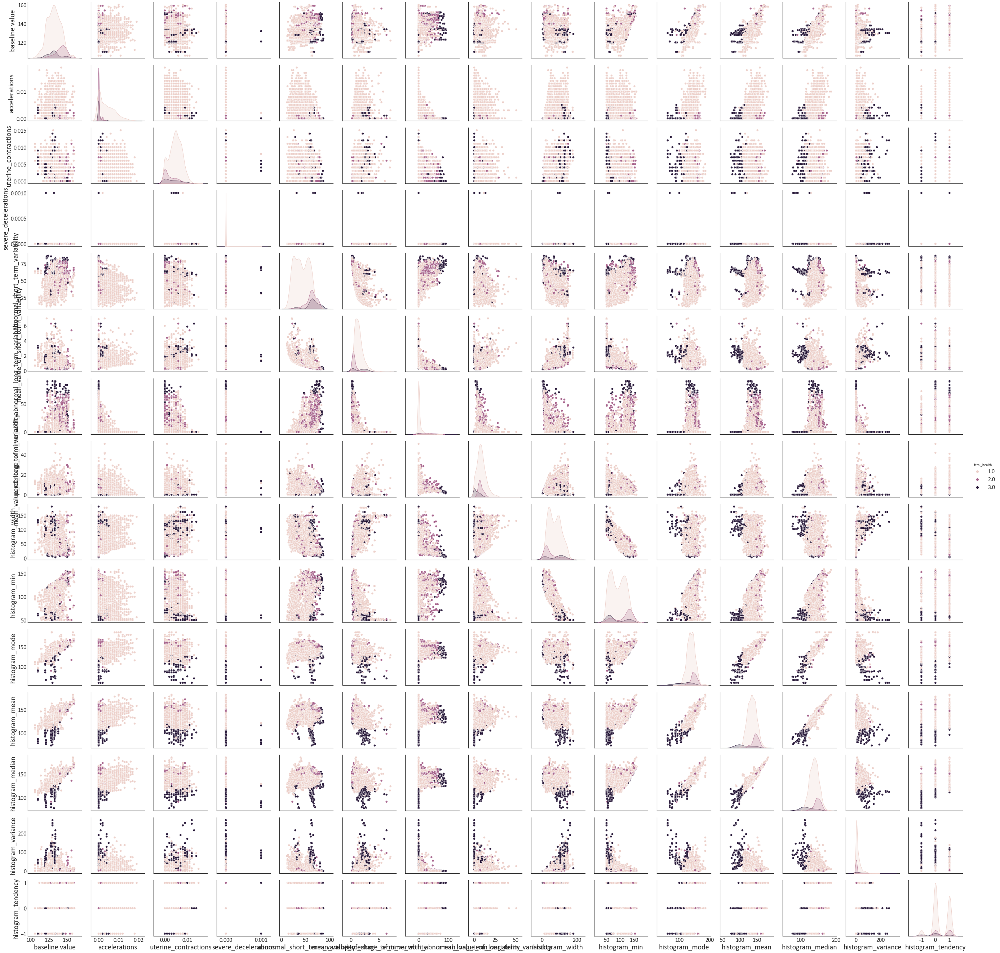

In [65]:
sns.pairplot(data=df1,hue='fetal_health')

In [15]:
df1.corr()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
baseline value,1.000000,-0.080560,-0.033436,-0.146373,-0.159032,-0.053518,-0.104597,0.305570,-0.279607,0.285630,...,0.361619,0.275110,-0.113933,-0.004745,0.708993,0.723121,0.789246,-0.133938,0.293503,0.148151
accelerations,-0.080560,1.000000,0.048235,0.089674,-0.108615,-0.043018,-0.127749,-0.279577,0.207170,-0.373943,...,-0.154286,0.394147,0.190452,-0.006147,0.243610,0.270334,0.272849,0.125704,0.028420,-0.364066
fetal_movement,-0.033436,0.048235,1.000000,-0.068779,0.049228,-0.010976,0.265922,-0.103715,0.121314,-0.074096,...,-0.153917,0.099853,0.164654,-0.017749,-0.061192,-0.089671,-0.072329,0.179340,-0.001541,0.088010
uterine_contractions,-0.146373,0.089674,-0.068779,1.000000,0.285079,0.006788,0.077036,-0.232811,0.289679,-0.306608,...,-0.113323,0.122766,0.082693,0.057894,-0.104854,-0.187505,-0.140287,0.238582,-0.072314,-0.204894
light_decelerations,-0.159032,-0.108615,0.049228,0.285079,1.000000,0.107573,0.225611,-0.119152,0.562170,-0.271282,...,-0.553534,0.218043,0.397620,0.235296,-0.347233,-0.527354,-0.388586,0.564289,0.000072,0.058870
severe_decelerations,-0.053518,-0.043018,-0.010976,0.006788,0.107573,1.000000,0.012395,0.033949,0.034130,-0.030770,...,-0.071974,-0.021135,0.007024,0.043441,-0.215161,-0.158673,-0.160451,0.136421,-0.070483,0.131934
prolongued_decelerations,-0.104597,-0.127749,0.265922,0.077036,0.225611,0.012395,1.000000,0.046226,0.267011,-0.137333,...,-0.276764,0.120221,0.222860,0.056423,-0.436416,-0.488663,-0.444778,0.503301,-0.215405,0.484859
abnormal_short_term_variability,0.305570,-0.279577,-0.103715,-0.232811,-0.119152,0.033949,0.046226,1.000000,-0.430705,0.459413,...,0.275378,-0.111806,-0.167561,-0.149296,0.058363,0.074554,0.119960,-0.146434,-0.005748,0.471191
mean_value_of_short_term_variability,-0.279607,0.207170,0.121314,0.289679,0.562170,0.034130,0.267011,-0.430705,1.000000,-0.470259,...,-0.622569,0.409072,0.501430,0.266183,-0.307586,-0.445401,-0.336109,0.555852,-0.066140,-0.103382
percentage_of_time_with_abnormal_long_term_variability,0.285630,-0.373943,-0.074096,-0.306608,-0.271282,-0.030770,-0.137333,0.459413,-0.470259,1.000000,...,0.422834,-0.283183,-0.279301,-0.121784,0.165211,0.222321,0.186480,-0.281536,0.042481,0.426146


<AxesSubplot:>

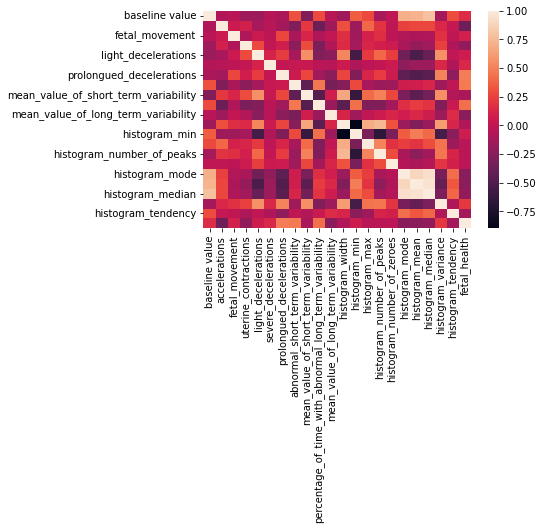

In [16]:
sns.heatmap(df1.corr())

In [18]:
features = list(df1.columns)

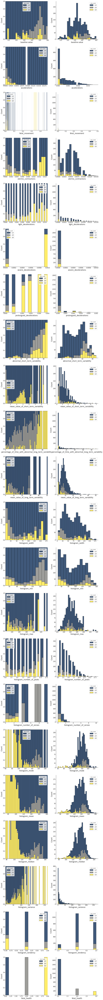

In [19]:
plt.style.use('seaborn-white')
plt.rcParams['figure.figsize']=16,8*len(df.columns)
plt.rcParams['font.family'] = 'Calibri'
plt.rcParams['lines.linewidth'] = 3
plt.rcParams['axes.labelsize']=20
plt.rcParams['xtick.labelsize']=16
plt.rcParams['ytick.labelsize']=16
plt.rcParams['legend.fontsize']=16
plt.rcParams['legend.frameon']=True

fig,ax = plt.subplots(nrows=len(df.columns), ncols=2,)
i=0
for feature in features:

    sns.histplot(data = df,
                     x=feature,
                     hue='fetal_health',
                     palette='cividis',
                     multiple='fill',
                    ax=ax[i,0]
                        )

    sns.histplot(data = df,
                     x=feature,
                     hue='fetal_health',
                     palette='cividis',
                     multiple='stack',
                    ax=ax[i,1])
    i+=1
sns.despine()

In [20]:
X_train,X_test,y_train,y_test=train_test_split(df1.drop(labels=['fetal_health'], axis=1),
    df1['fetal_health'],
    test_size=0.3,
    random_state=0)

In [21]:
X_train.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency
994,129.0,0.004,0.00,0.001,0.000,0.0,0.000,27.0,1.2,1.0,...,60.0,98.0,158.0,3.0,0.0,133.0,133.0,134.0,4.0,0.0
1618,142.0,0.003,0.05,0.002,0.006,0.0,0.001,66.0,3.3,0.0,...,113.0,67.0,180.0,7.0,0.0,141.0,111.0,147.0,90.0,1.0
177,119.0,0.008,0.00,0.005,0.001,0.0,0.000,30.0,1.8,0.0,...,129.0,69.0,198.0,9.0,0.0,132.0,132.0,135.0,20.0,0.0
519,126.0,0.008,0.04,0.005,0.000,0.0,0.000,42.0,1.5,0.0,...,147.0,51.0,198.0,9.0,0.0,133.0,136.0,134.0,13.0,0.0
745,142.0,0.001,0.00,0.005,0.012,0.0,0.000,23.0,3.6,0.0,...,144.0,50.0,194.0,12.0,1.0,143.0,127.0,135.0,72.0,0.0


In [22]:
X_test.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency
658,130.0,0.001,0.000,0.004,0.000,0.0,0.0,24.0,1.2,12.0,...,35.0,120.0,155.0,1.0,0.0,134.0,133.0,135.0,1.0,0.0
1734,134.0,0.008,0.001,0.007,0.004,0.0,0.0,59.0,1.2,0.0,...,109.0,80.0,189.0,6.0,0.0,150.0,146.0,150.0,33.0,0.0
1226,125.0,0.001,0.000,0.004,0.000,0.0,0.0,43.0,0.7,31.0,...,21.0,120.0,141.0,0.0,0.0,131.0,130.0,132.0,1.0,0.0
1808,143.0,0.000,0.000,0.001,0.000,0.0,0.0,69.0,0.3,6.0,...,27.0,132.0,159.0,1.0,0.0,145.0,144.0,146.0,1.0,0.0
825,152.0,0.000,0.000,0.005,0.000,0.0,0.0,62.0,0.4,59.0,...,25.0,136.0,161.0,0.0,0.0,159.0,156.0,158.0,1.0,1.0


In [23]:
y_train

994     1.0
1618    1.0
177     1.0
519     1.0
745     1.0
       ... 
1033    1.0
1731    1.0
763     1.0
835     1.0
1653    1.0
Name: fetal_health, Length: 1488, dtype: float64

In [24]:
y_test

658     1.0
1734    1.0
1226    1.0
1808    1.0
825     2.0
       ... 
1934    1.0
1644    1.0
1786    1.0
1421    1.0
89      2.0
Name: fetal_health, Length: 638, dtype: float64

In [25]:
from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info

array([0.13338841, 0.14712201, 0.04875714, 0.04991959, 0.07603065,
       0.02064842, 0.0729817 , 0.18337024, 0.22593782, 0.1969252 ,
       0.082628  , 0.13788615, 0.11191296, 0.05646705, 0.02944607,
       0.01639489, 0.14613731, 0.13996391, 0.12512531, 0.14932911,
       0.01766491])

In [26]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False)

mean_value_of_short_term_variability                      0.225938
percentage_of_time_with_abnormal_long_term_variability    0.196925
abnormal_short_term_variability                           0.183370
histogram_variance                                        0.149329
accelerations                                             0.147122
histogram_mode                                            0.146137
histogram_mean                                            0.139964
histogram_width                                           0.137886
baseline value                                            0.133388
histogram_median                                          0.125125
histogram_min                                             0.111913
mean_value_of_long_term_variability                       0.082628
light_decelerations                                       0.076031
prolongued_decelerations                                  0.072982
histogram_max                                             0.05

<AxesSubplot:>

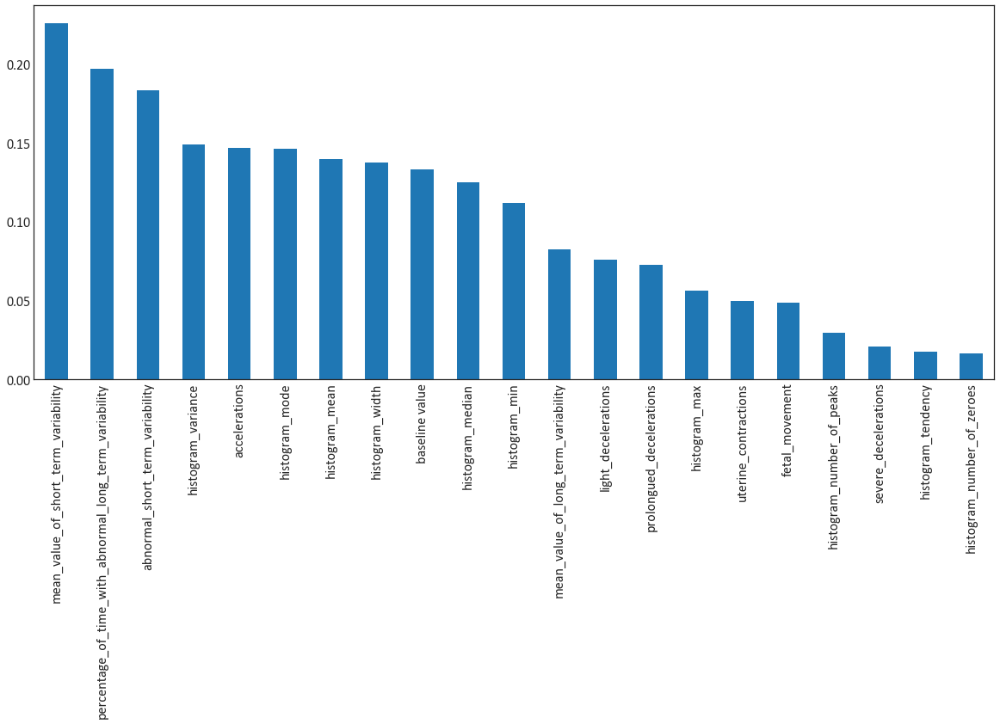

In [27]:
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))

In [28]:
from sklearn.feature_selection import SelectKBest
#No we Will select the  top 15 important features
sel_five_cols = SelectKBest(mutual_info_classif, k=15)
sel_five_cols.fit(X_train, y_train)
X_train.columns[sel_five_cols.get_support()]

Index(['baseline value', 'accelerations', 'uterine_contractions',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability', 'histogram_width',
       'histogram_min', 'histogram_max', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance'],
      dtype='object')

In [29]:
list_drop = ['light_decelerations','prolongued_decelerations','fetal_movement','histogram_number_of_zeroes','histogram_max','histogram_number_of_peaks']
df1.drop(list_drop,axis=1,inplace=True)

In [30]:
df1.head()

,baseline value,accelerations,uterine_contractions,severe_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,mean_value_of_long_term_variability,histogram_width,histogram_min,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.000,0.0,73.0,0.5,43.0,2.4,64.0,62.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.006,0.0,17.0,2.1,0.0,10.4,130.0,68.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.008,0.0,16.0,2.1,0.0,13.4,130.0,68.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.008,0.0,16.0,2.4,0.0,23.0,117.0,53.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.008,0.0,16.0,2.4,0.0,19.9,117.0,53.0,137.0,136.0,138.0,11.0,1.0,1.0


In [31]:
df1.shape

(2126, 16)

In [32]:
X_train,X_test,y_train,y_test=train_test_split(df1.drop(labels=['fetal_health'], axis=1),
    df1['fetal_health'],
    test_size=0.3,
    random_state=0)

In [33]:
X_train.head()

,baseline value,accelerations,uterine_contractions,severe_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,mean_value_of_long_term_variability,histogram_width,histogram_min,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency
994,129.0,0.004,0.001,0.0,27.0,1.2,1.0,7.9,60.0,98.0,133.0,133.0,134.0,4.0,0.0
1618,142.0,0.003,0.002,0.0,66.0,3.3,0.0,0.3,113.0,67.0,141.0,111.0,147.0,90.0,1.0
177,119.0,0.008,0.005,0.0,30.0,1.8,0.0,10.0,129.0,69.0,132.0,132.0,135.0,20.0,0.0
519,126.0,0.008,0.005,0.0,42.0,1.5,0.0,7.8,147.0,51.0,133.0,136.0,134.0,13.0,0.0
745,142.0,0.001,0.005,0.0,23.0,3.6,0.0,1.9,144.0,50.0,143.0,127.0,135.0,72.0,0.0


In [34]:
X_test.head()

,baseline value,accelerations,uterine_contractions,severe_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,mean_value_of_long_term_variability,histogram_width,histogram_min,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency
658,130.0,0.001,0.004,0.0,24.0,1.2,12.0,7.6,35.0,120.0,134.0,133.0,135.0,1.0,0.0
1734,134.0,0.008,0.007,0.0,59.0,1.2,0.0,5.2,109.0,80.0,150.0,146.0,150.0,33.0,0.0
1226,125.0,0.001,0.004,0.0,43.0,0.7,31.0,7.8,21.0,120.0,131.0,130.0,132.0,1.0,0.0
1808,143.0,0.000,0.001,0.0,69.0,0.3,6.0,9.4,27.0,132.0,145.0,144.0,146.0,1.0,0.0
825,152.0,0.000,0.005,0.0,62.0,0.4,59.0,5.6,25.0,136.0,159.0,156.0,158.0,1.0,1.0


In [35]:
y_train.head()

994     1.0
1618    1.0
177     1.0
519     1.0
745     1.0
Name: fetal_health, dtype: float64

In [36]:
y_test.head()

658     1.0
1734    1.0
1226    1.0
1808    1.0
825     2.0
Name: fetal_health, dtype: float64

In [37]:
X_train.shape

(1488, 15)

In [38]:
X_test.shape

(638, 15)

In [39]:
from sklearn.preprocessing import StandardScaler

In [40]:
scaler=StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [41]:
from sklearn.linear_model import LogisticRegression
logic_reg = LogisticRegression()
logic_reg.fit(X_train,y_train)

LogisticRegression()

In [42]:
logic_reg.coef_

array([[-0.9610544 ,  1.86641971,  0.57214407,  0.16889846, -1.06070971,
         0.38689723, -0.56475411, -0.15222995, -0.79405741, -0.86024606,
         0.68622443, -0.43544434,  1.12885463, -1.21619588, -0.08714425],
       [-1.05759493, -1.29048914, -0.16152308, -0.07843963,  0.04458161,
        -0.21054086, -0.09963354, -0.03561876,  0.82976793,  0.90157857,
        -0.11737901,  1.51947561,  0.48621219,  0.35834344,  0.12766134],
       [ 2.01864933, -0.57593057, -0.41062098, -0.09045883,  1.0161281 ,
        -0.17635636,  0.66438765,  0.18784871, -0.03571052, -0.04133251,
        -0.56884542, -1.08403127, -1.61506682,  0.85785244, -0.04051709]])

In [43]:
y_log_reg_pred_train = logic_reg.predict(X_train)
y_log_reg_pred_train

array([1., 1., 1., ..., 1., 1., 1.])

In [44]:
y_log_reg_pred_test = logic_reg.predict(X_test)
y_log_reg_pred_test

array([1., 1., 1., 2., 2., 1., 1., 1., 1., 1., 3., 1., 1., 1., 1., 1., 1.,
       1., 1., 2., 1., 1., 1., 3., 1., 1., 1., 2., 1., 2., 1., 1., 1., 1.,
       1., 1., 2., 1., 2., 1., 1., 2., 1., 1., 2., 1., 1., 1., 1., 1., 1.,
       1., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 2., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 2., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 2., 1., 1.,
       1., 3., 1., 2., 1., 1., 3., 2., 1., 1., 1., 1., 1., 1., 2., 2., 1.,
       1., 3., 2., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 3., 1.,
       2., 1., 1., 1., 1., 2., 1., 2., 2., 2., 3., 1., 1., 1., 1., 1., 2.,
       2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       3., 1., 1., 1., 1., 1., 1., 3., 1., 1., 1., 1., 1., 1., 1., 1., 3.,
       1., 2., 2., 1., 1., 1., 1., 1., 1., 3., 2., 1., 3., 2., 1., 3., 2.,
       1., 1., 1., 1., 1., 2., 1., 1., 1., 2., 1., 1., 1., 1., 2., 1., 1.,
       1., 3., 1., 1., 1.

In [45]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,plot_confusion_matrix

In [46]:
accuracy_score(y_train,y_log_reg_pred_train)

0.8958333333333334

In [47]:
accuracy_score(y_test,y_log_reg_pred_test)

0.877742946708464

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


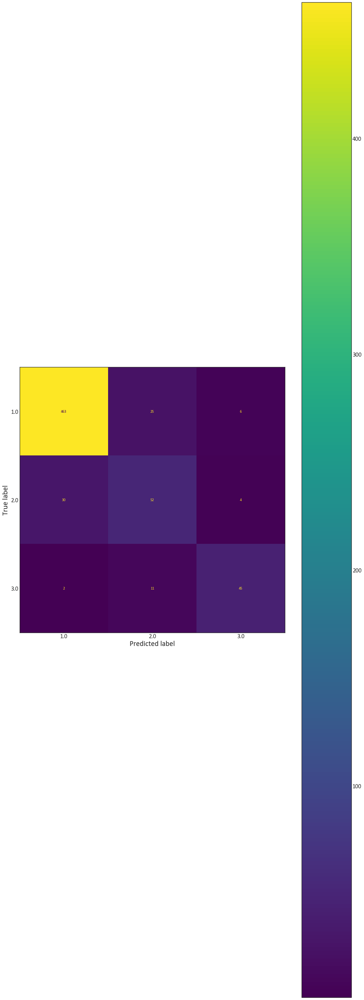

In [48]:
plot_confusion_matrix(logic_reg,X_test,y_test)

In [49]:
print(classification_report(y_test,y_log_reg_pred_test))

              precision    recall  f1-score   support

         1.0       0.94      0.94      0.94       494
         2.0       0.59      0.60      0.60        86
         3.0       0.82      0.78      0.80        58

    accuracy                           0.88       638
   macro avg       0.78      0.77      0.78       638
weighted avg       0.88      0.88      0.88       638



In [50]:
from sklearn.neighbors import KNeighborsClassifier

In [51]:
knn_classify = KNeighborsClassifier()
knn_classify.fit(X_train,y_train)

KNeighborsClassifier()

In [52]:
y_knn_pred_train = knn_classify.predict(X_train)

In [53]:
y_knn_pred_test = knn_classify.predict(X_test)

In [54]:
accuracy_score(y_train,y_knn_pred_train)

0.9348118279569892

In [55]:
accuracy_score(y_test,y_knn_pred_test)

0.8949843260188087

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


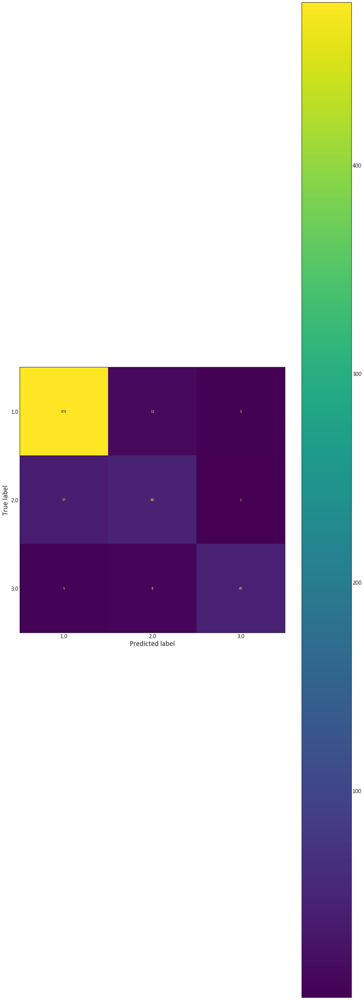

In [56]:
plot_confusion_matrix(knn_classify,X_test,y_test)

In [57]:
print(classification_report(y_test,y_knn_pred_test))

              precision    recall  f1-score   support

         1.0       0.92      0.97      0.94       494
         2.0       0.70      0.56      0.62        86
         3.0       0.92      0.78      0.84        58

    accuracy                           0.89       638
   macro avg       0.84      0.77      0.80       638
weighted avg       0.89      0.89      0.89       638



In [58]:
from sklearn.model_selection import GridSearchCV

In [59]:
param_knn_grid = {'n_neighbors':list(range(1,100)), 'weights':['uniform','distance'], 'p':[1,2]}

In [60]:
knn_classify = KNeighborsClassifier()

knn_grid = GridSearchCV(knn_classify,param_knn_grid,cv=5,scoring='accuracy')
knn_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30, ...],
                         'p': [1, 2], 'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [61]:
knn_grid.best_params_

{'n_neighbors': 3, 'p': 1, 'weights': 'distance'}

In [62]:
knn_predictions = knn_grid.predict(X_test)

In [63]:
print(classification_report(y_test,knn_predictions))

              precision    recall  f1-score   support

         1.0       0.95      0.95      0.95       494
         2.0       0.66      0.67      0.67        86
         3.0       0.91      0.83      0.86        58

    accuracy                           0.90       638
   macro avg       0.84      0.82      0.83       638
weighted avg       0.90      0.90      0.90       638



C:\Users\shyam\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


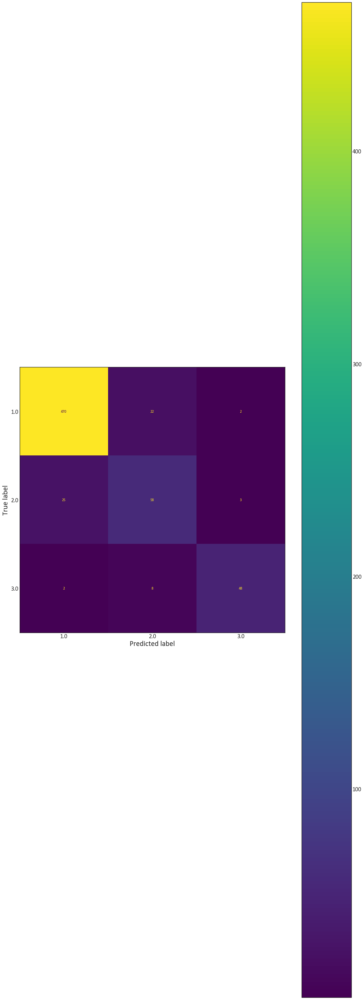

In [64]:
plot_confusion_matrix(knn_grid,X_test,y_test)

In [66]:
from sklearn.tree import DecisionTreeClassifier

In [67]:
dtr = DecisionTreeClassifier()

In [68]:
dtr.fit(X_train,y_train)

DecisionTreeClassifier()

In [69]:
y_pred_train_dtr = dtr.predict(X_train)

In [70]:
y_pred_test_dtr = dtr.predict(X_test)

In [71]:
accuracy_score(y_train,y_pred_train_dtr)

0.9986559139784946

In [72]:
accuracy_score(y_test,y_pred_test_dtr)

0.9075235109717869

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


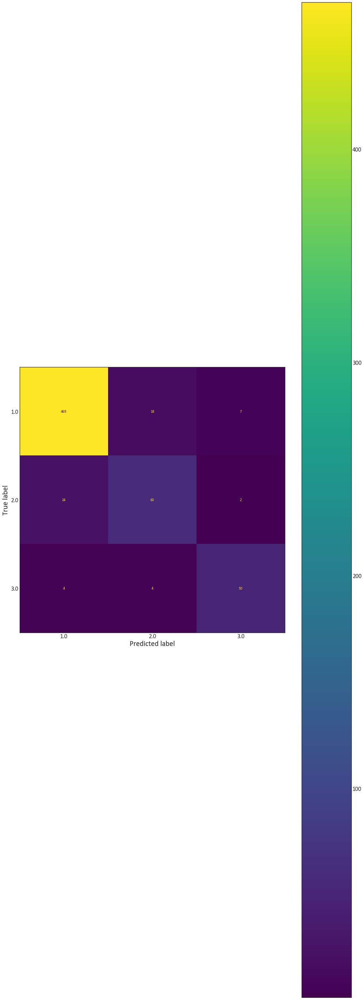

In [73]:
plot_confusion_matrix(dtr,X_test,y_test)

In [75]:
print(classification_report(y_test,y_pred_test_dtr))

              precision    recall  f1-score   support

         1.0       0.94      0.95      0.95       494
         2.0       0.73      0.70      0.71        86
         3.0       0.85      0.86      0.85        58

    accuracy                           0.91       638
   macro avg       0.84      0.84      0.84       638
weighted avg       0.91      0.91      0.91       638



In [79]:
param_dtr_grid = {'criterion':['gini','entropy'], 'splitter':['best','random'], 'max_depth':[1,2,3,4,5,6,7,8]}

In [81]:
dtr_classify = DecisionTreeClassifier()

dtr_grid = GridSearchCV(dtr_classify,param_dtr_grid,cv=5,scoring='accuracy')
dtr_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [82]:
dtr_grid.best_params_

{'criterion': 'gini', 'max_depth': 7, 'splitter': 'best'}

In [83]:
dtr_predictions = dtr_grid.predict(X_test)

In [84]:
print(classification_report(y_test,dtr_predictions))

              precision    recall  f1-score   support

         1.0       0.94      0.97      0.96       494
         2.0       0.79      0.71      0.75        86
         3.0       0.96      0.86      0.91        58

    accuracy                           0.93       638
   macro avg       0.90      0.85      0.87       638
weighted avg       0.92      0.93      0.92       638



In [85]:
from sklearn.ensemble import RandomForestClassifier

In [86]:
randfor =  RandomForestClassifier()

In [87]:
randfor.fit(X_train,y_train)

RandomForestClassifier()

In [88]:
y_rand_pred_train = randfor.predict(X_train)

In [89]:
y_rand_pred_test = randfor.predict(X_test)

In [90]:
accuracy_score(y_train,y_rand_pred_train)

0.9986559139784946

In [91]:
accuracy_score(y_test,y_rand_pred_test)

0.9467084639498433

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


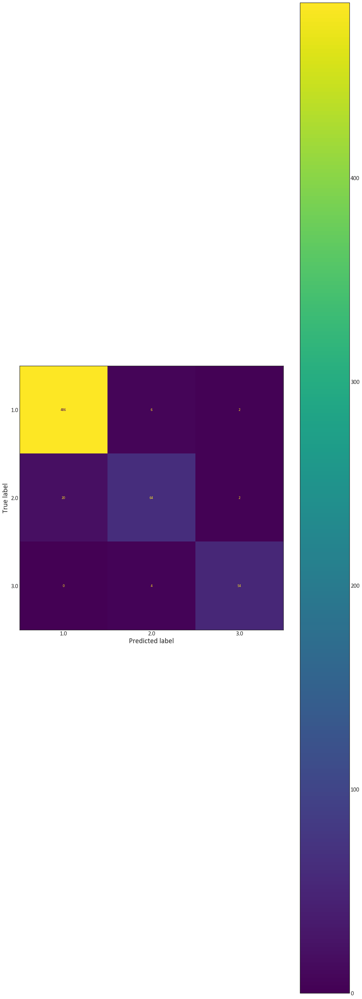

In [92]:
plot_confusion_matrix(randfor,X_test,y_test)

In [93]:
print(classification_report(y_test,y_rand_pred_test))

              precision    recall  f1-score   support

         1.0       0.96      0.98      0.97       494
         2.0       0.86      0.74      0.80        86
         3.0       0.93      0.93      0.93        58

    accuracy                           0.95       638
   macro avg       0.92      0.89      0.90       638
weighted avg       0.94      0.95      0.95       638



In [94]:
randfor.feature_importances_

array([4.91959963e-02, 5.38231549e-02, 4.49605867e-02, 3.04044383e-05,
       1.54388711e-01, 1.13395777e-01, 1.29393348e-01, 5.39779726e-02,
       4.42106980e-02, 5.33789865e-02, 7.11492353e-02, 1.06460367e-01,
       6.58266392e-02, 5.11457888e-02, 8.66233486e-03])

In [95]:
test_rand_acc = []
train_rand_acc = []
for i in range(1,100):
        randfor = RandomForestClassifier(n_estimators=i,max_features='auto',bootstrap=True)
        randfor.fit(X_train,y_train)
        
        rand_train_pred = randfor.predict(X_train)
        rand_test_pred = randfor.predict(X_test)
        
        train_rand_acc.append(accuracy_score(rand_train_pred,y_train))
        test_rand_acc.append(accuracy_score(rand_test_pred,y_test))

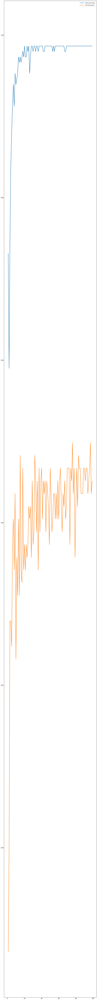

In [96]:
plt.plot(range(1,100),train_rand_acc,label='Train Accuracy')
plt.plot(range(1,100),test_rand_acc,label='Test Accuracy')

plt.legend()
plt.show()

In [97]:
from sklearn.model_selection import GridSearchCV

In [98]:
params_rand_grid = {'n_estimators':list(range(1,50)), 'max_features':list(range(1,11))}

In [100]:
randfor = RandomForestClassifier()

rand_grid = GridSearchCV(randfor,params_rand_grid,cv=5,scoring='accuracy')
rand_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_features': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'n_estimators': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                          13, 14, 15, 16, 17, 18, 19, 20, 21,
                                          22, 23, 24, 25, 26, 27, 28, 29, 30, ...]},
             scoring='accuracy')

In [101]:
rand_grid.best_params_

{'max_features': 5, 'n_estimators': 44}

In [102]:
randfor_predictions = rand_grid.predict(X_test)

In [103]:
print(classification_report(y_test,randfor_predictions))

              precision    recall  f1-score   support

         1.0       0.96      0.98      0.97       494
         2.0       0.85      0.72      0.78        86
         3.0       0.93      0.93      0.93        58

    accuracy                           0.94       638
   macro avg       0.91      0.88      0.89       638
weighted avg       0.94      0.94      0.94       638



C:\Users\shyam\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


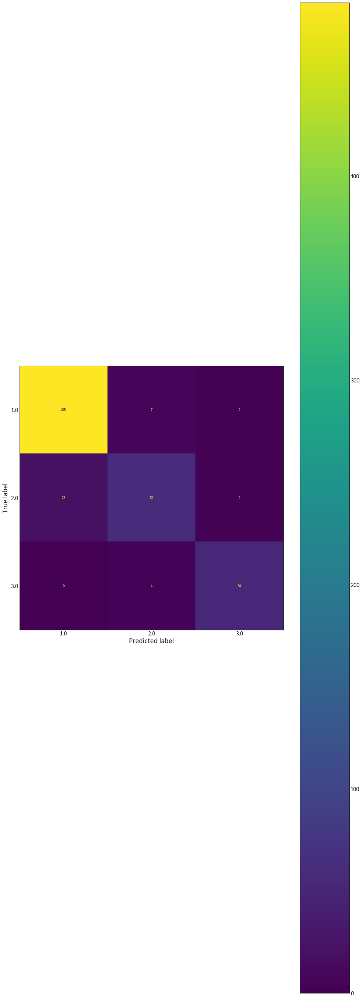

In [104]:
plot_confusion_matrix(rand_grid,X_test,y_test)

In [105]:
from sklearn.ensemble import AdaBoostClassifier

In [106]:
adaboost_classify = AdaBoostClassifier()

In [107]:
adaboost_classify.fit(X_train,y_train)

AdaBoostClassifier()

In [108]:
adaboost_pred_train = adaboost_classify.predict(X_train)

In [109]:
adaboost_pred_test = adaboost_classify.predict(X_test)

In [110]:
accuracy_score(y_train,adaboost_pred_train)

0.8918010752688172

In [111]:
accuracy_score(y_test,adaboost_pred_test)

0.8746081504702194

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


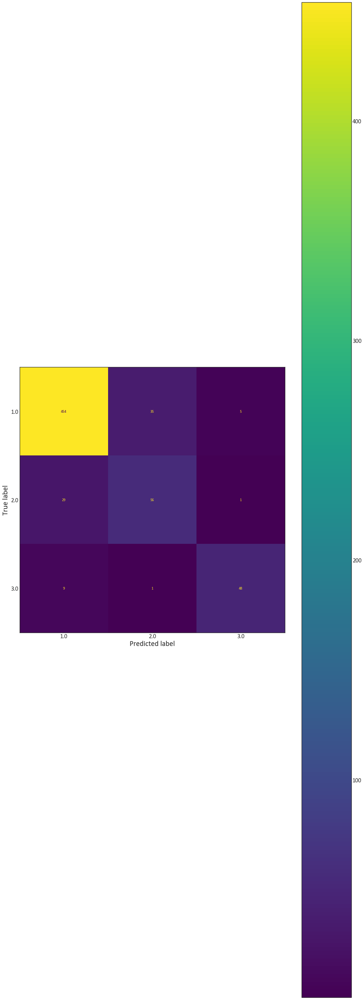

In [112]:
plot_confusion_matrix(adaboost_classify,X_test,y_test)

In [113]:
print(classification_report(y_test,adaboost_pred_test))

              precision    recall  f1-score   support

         1.0       0.92      0.92      0.92       494
         2.0       0.61      0.65      0.63        86
         3.0       0.89      0.83      0.86        58

    accuracy                           0.87       638
   macro avg       0.81      0.80      0.80       638
weighted avg       0.88      0.87      0.88       638



In [114]:
adaboost_classify.feature_importances_

array([0.14, 0.04, 0.06, 0.  , 0.14, 0.14, 0.1 , 0.  , 0.  , 0.  , 0.06,
       0.14, 0.1 , 0.06, 0.02])

In [115]:
error_adaboost_rates = []

for i in range(1,100):
    adaboost_classify = AdaBoostClassifier(n_estimators=i)
    adaboost_classify.fit(X_train,y_train)
    adaboost_pred = adaboost_classify.predict(X_test)
    error = 1-accuracy_score(y_test,adaboost_pred)
    
    error_adaboost_rates.append(error)

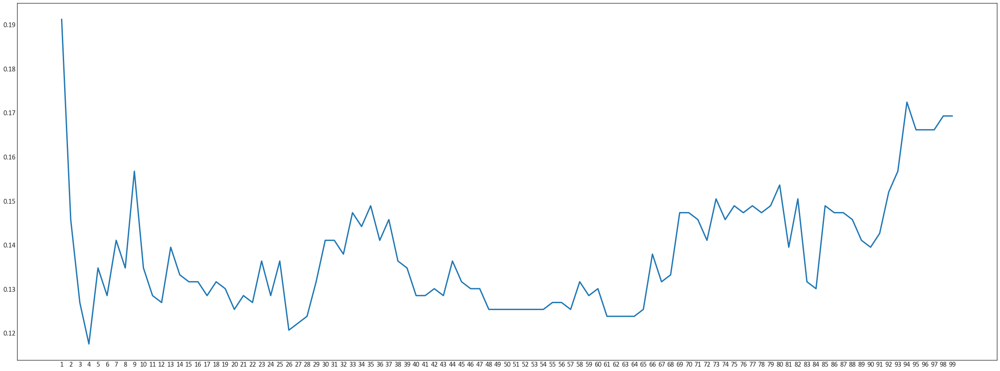

In [116]:
plt.figure(figsize=(40,15))
plt.plot(range(1,100),error_adaboost_rates)
plt.xticks(list(range(1,100)))
plt.show()

In [117]:
adaboost_final_model = AdaBoostClassifier(n_estimators=4)
adaboost_final_model.fit(X_train,y_train)

adaboost_final_pred_train = adaboost_final_model.predict(X_train)
adaboost_final_pred_test = adaboost_final_model.predict(X_test)

print('AdaBoost Train Accuracy Score: ', accuracy_score(y_train,adaboost_final_pred_train))
print('AdaBoost Test Accuracy Score: ', accuracy_score(y_test,adaboost_final_pred_test))

AdaBoost Train Accuracy Score:  0.8897849462365591
AdaBoost Test Accuracy Score:  0.8824451410658307


In [118]:
adaboost_final_model.feature_importances_

array([0.  , 0.  , 0.  , 0.  , 0.25, 0.25, 0.25, 0.  , 0.  , 0.  , 0.  ,
       0.25, 0.  , 0.  , 0.  ])

In [119]:
from sklearn.ensemble import GradientBoostingClassifier
gbc = GradientBoostingClassifier()
gbc.fit(X_train,y_train)

GradientBoostingClassifier()

In [120]:
gbc_pred_train = gbc.predict(X_train)

In [121]:
gbc_pred_test = gbc.predict(X_test)

In [122]:
accuracy_score(y_train,gbc_pred_train)

0.9919354838709677

In [123]:
accuracy_score(y_test,gbc_pred_test)

0.9467084639498433

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


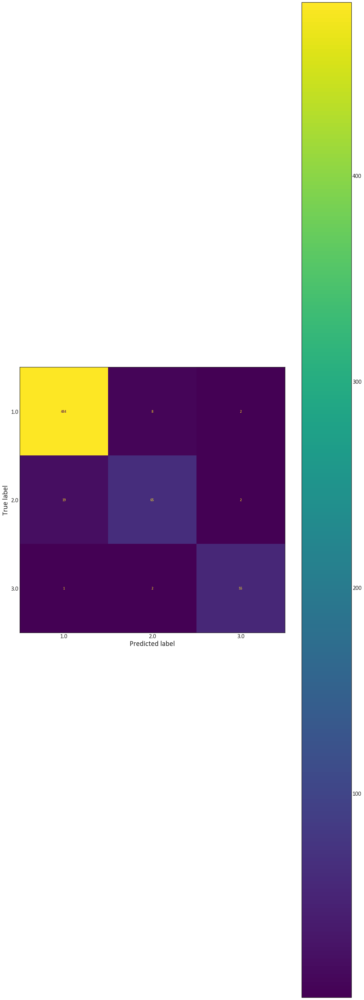

In [124]:
plot_confusion_matrix(gbc,X_test,y_test)

In [125]:
print(classification_report(y_test,gbc_pred_test))

              precision    recall  f1-score   support

         1.0       0.96      0.98      0.97       494
         2.0       0.87      0.76      0.81        86
         3.0       0.93      0.95      0.94        58

    accuracy                           0.95       638
   macro avg       0.92      0.89      0.91       638
weighted avg       0.95      0.95      0.95       638



In [129]:
gbc_param_grid = {'n_estimators':[1,5,10,20,40,100,200,300,500],'learning_rate':[0.1,0.2,0.3,0.5,0.8,1]}
gbc_grid = GridSearchCV(gbc,gbc_param_grid,cv=5,scoring='accuracy')
gbc_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.1, 0.2, 0.3, 0.5, 0.8, 1],
                         'n_estimators': [1, 5, 10, 20, 40, 100, 200, 300,
                                          500]},
             scoring='accuracy')

In [131]:
gbc_grid.best_params_

{'learning_rate': 0.2, 'n_estimators': 300}

In [132]:
gbc_final = GradientBoostingClassifier(n_estimators=300,learning_rate=0.2)
gbc_final.fit(X_train,y_train)
gbc_final_pred_train = gbc_final.predict(X_train)
gbc_final_pred_test = gbc_final.predict(X_test)

In [133]:
accuracy_score(y_train,gbc_final_pred_train)

0.9986559139784946

In [135]:
accuracy_score(y_test,gbc_final_pred_test)

0.9482758620689655

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


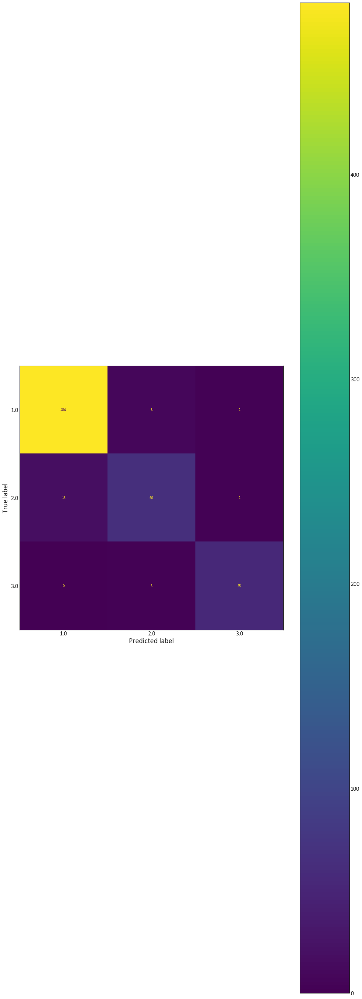

In [136]:
plot_confusion_matrix(gbc_final,X_test,y_test)

In [137]:
print(classification_report(y_test,gbc_final_pred_test))

              precision    recall  f1-score   support

         1.0       0.96      0.98      0.97       494
         2.0       0.86      0.77      0.81        86
         3.0       0.93      0.95      0.94        58

    accuracy                           0.95       638
   macro avg       0.92      0.90      0.91       638
weighted avg       0.95      0.95      0.95       638



In [141]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train = le.fit_transform(y_train)

In [142]:
from xgboost import XGBClassifier

In [143]:
xgb = XGBClassifier()

In [144]:
xgb.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

In [145]:
xgb_pred_train = xgb.predict(X_train)
xgb_pred_test = xgb.predict(X_test)

In [146]:
accuracy_score(y_train,xgb_pred_train)

0.9986559139784946

In [147]:
accuracy_score(y_test,xgb_pred_test)

0.02037617554858934

In [149]:
xgb_param_grid = {'n_estimators':[1,5,10,20,40,100,200,300,500],'max_depth':[3,4,5,6,7,8,9],'learning_rate':[0.1,0.2,0.3,0.5,0.8,1]}


In [150]:
xgb_grid = GridSearchCV(xgb,xgb_param_grid,cv=5,scoring='accuracy')
xgb_grid.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     callbacks=None, colsample_bylevel=1,
                                     colsample_bynode=1, colsample_bytree=1,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=0, gpu_id=-1,
                                     grow_policy='depthwise',
                                     importance_type=None,
                                     interaction_constraints='',
                                     learning_rate=0.300000012, max_bin=256,
                                     max_ca...
                                     max_depth=6, max_leaves=0,
                                     min_child_weight=1, missing=nan,
                                     monotone_constraints='()',
                                     n_estimator

In [151]:
xgb_grid.best_params_

{'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 200}

In [152]:
xgb_grid_pred = xgb_grid.predict(X_test)

In [153]:
print(classification_report(y_test,xgb_grid_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.0       0.09      0.01      0.02       494
         2.0       0.03      0.02      0.03        86
         3.0       0.00      0.00      0.00        58

    accuracy                           0.01       638
   macro avg       0.03      0.01      0.01       638
weighted avg       0.07      0.01      0.02       638



C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_cla